# LangSmith Evaluation Deep Dive

## Preface

* `Video 1:` Slides reviewing why evals are important [here](https://docs.google.com/presentation/d/1y_dYspY8odgVvE4OfimCLmw9QHz7QPkYNMvK8wyg9bY/edit?usp=sharing)
* `Video 2:` Slides reviewing LangSmith primitives [here](https://docs.google.com/presentation/d/1N1JKe_7qLIuiY2M40gKFGGYTb37t6F_oqGLUpw5oXy4/edit?usp=sharing)

## Summary

See here for an overview of evaluation:
https://docs.smith.langchain.com/evaluation

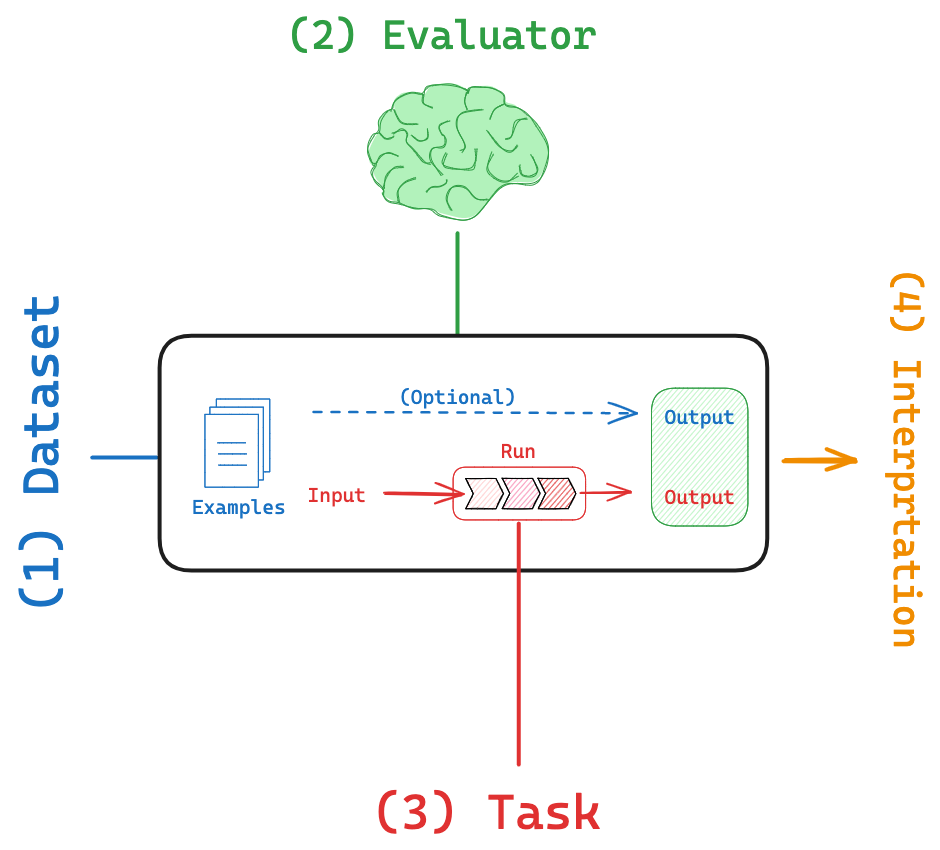

## Enviornment

In [ ]:
! pip install -U langsmith openai ollama

In [ ]:
import os
os.environ['LANGCHAIN_TRACING_V2'] = 'true' # enables tracing 
os.environ['LANGCHAIN_API_KEY'] = <your-api-key>

In [ ]:
import os
os.environ['LANGCHAIN_PROJECT'] = 'Test'

# 3. Dataset: Manually Curated

`Question:` 

How can I build my own dataset?

`Setup:` 

Let's build a dataset of question-answer pairs on this blog post about `DBRX`:

https://www.databricks.com/blog/introducing-dbrx-new-state-art-open-llm

We'll build a `Manually Curated` dataset of input, output pairs:

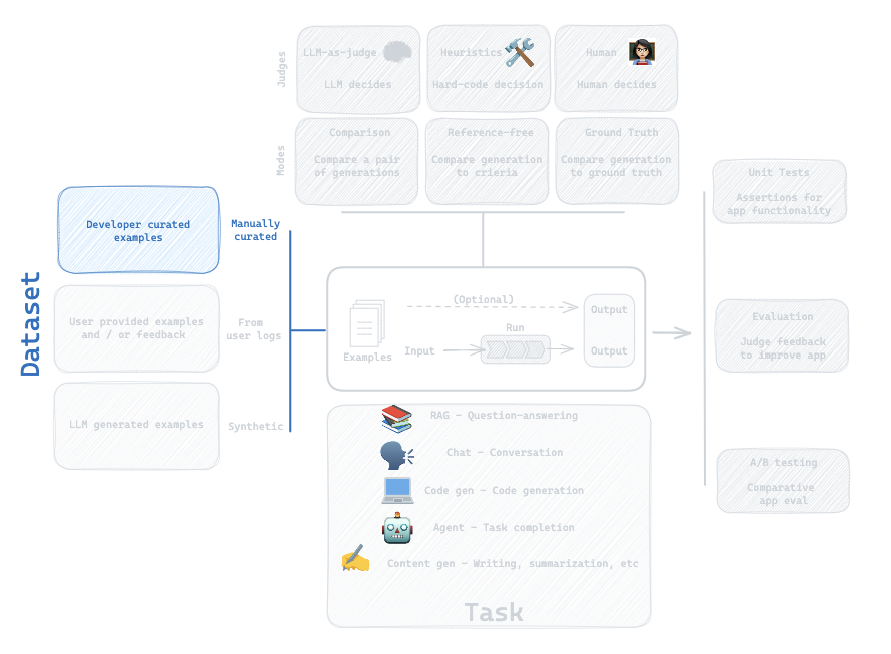

In [ ]:
import pandas as pd

# QA
inputs = [
    "How many tokens was DBRX pre-trained on?",
    "Is DBRX a MOE model and how many parameters does it have?",
    "How many GPUs was DBRX trained on and what was the connectivity between GPUs?"
]

outputs = [
    "DBRX was pre-trained on 12 trillion tokens of text and code data.",
    "Yes, DBRX is a fine-grained mixture-of-experts (MoE) architecture with 132B total parameters.",
    "DBRX was trained on 3072 NVIDIA H100s connected by 3.2Tbps Infiniband"
]

# Dataset
qa_pairs = [{"question": q, "answer": a} for q, a in zip(inputs, outputs)]
df = pd.DataFrame(qa_pairs)

# Write to csv
csv_path = "/Users/rlm/Desktop/DBRX_eval.csv"
df.to_csv(csv_path, index=False)

LangSmith SDK docs:

* https://docs.smith.langchain.com/evaluation/quickstart#1-create-a-dataset

In [ ]:
from langsmith import Client

client = Client()
dataset_name = "DBRX"

# Store
dataset = client.create_dataset(
    dataset_name=dataset_name,
    description="QA pairs about DBRX model.",
)
client.create_examples(
    inputs=[{"question": q} for q in inputs],
    outputs=[{"answer": a} for a in outputs],
    dataset_id=dataset.id,
)

Update dataset

In [ ]:
new_questions = [
    "What is the context window of DBRX Instruct?", 
]

new_answers = [
    "DBRX Instruct was trained with up to a 32K token context window.",
]

# See updated version in the UI
client.create_examples(
    inputs=[{"question": q} for q in new_questions],
    outputs=[{"answer": a} for a in new_answers],
    dataset_id=dataset.id,
)

We can also create a dataset directly from a csv with the LangSmith UI.

LangSmith UI docs:

https://docs.smith.langchain.com/evaluation/faq/manage-datasets

# 4. Dataset: From User Logs

`Question:` 

How can I save user logs as a dataset for future testing?

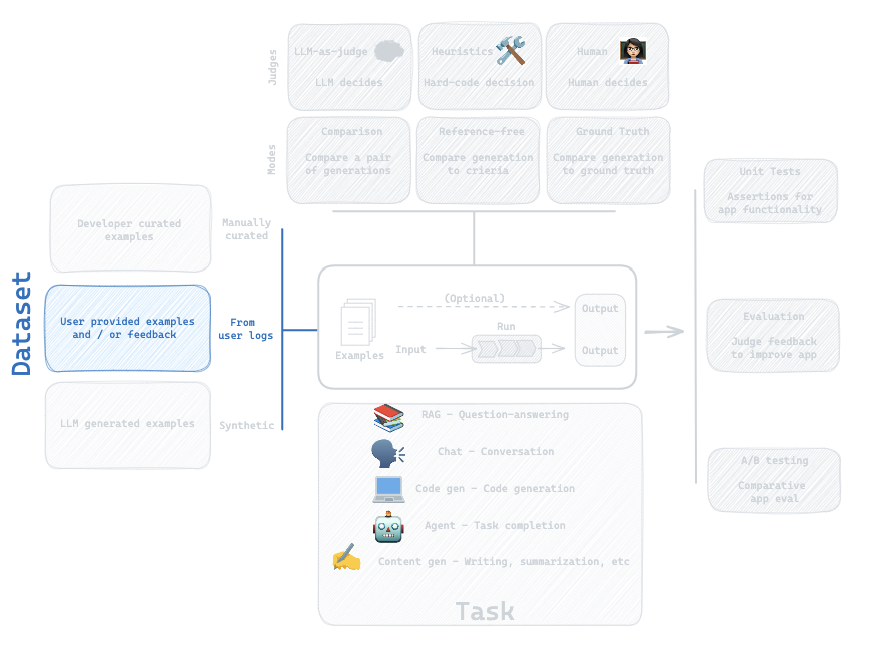

In [ ]:
# Create a new project where user question are logged

import os
os.environ['LANGCHAIN_PROJECT'] = 'DBRX'

In [ ]:
# Load blog post

import requests
from bs4 import BeautifulSoup
url = 'https://www.databricks.com/blog/introducing-dbrx-new-state-art-open-llm'
response = requests.get(url)
soup = BeautifulSoup(response.content, 'html.parser')
text = [p.text for p in soup.find_all('p')]
full_text = '\n'.join(text)

In [ ]:
# OpenAI API

import openai
from langsmith.wrappers import wrap_openai
openai_client = wrap_openai(openai.Client())

def answer_dbrx_question_oai(inputs: dict) -> dict:
    """
    Generates answers to user questions based on a provided website text using OpenAI API.

    Parameters:
    inputs (dict): A dictionary with a single key 'question', representing the user's question as a string.

    Returns:
    dict: A dictionary with a single key 'output', containing the generated answer as a string.
    """

    # System prompt 
    system_msg = f"Answer user questions in 2-3 sentences about this context: \n\n\n {full_text}"
    
    # Pass in website text
    messages = [{"role": "system", "content": system_msg},
                {"role": "user", "content": inputs["question"]}]

    # Call OpenAI
    response = openai_client.chat.completions.create(messages=messages, model="gpt-3.5-turbo")

    # Response in output dict
    return {"answer": response.dict()['choices'][0]['message']['content']} 

In [ ]:
# User question example

answer_dbrx_question_oai({"question":"What are the main differences in training efficiency between MPT-7B vs DBRX?"})

In [ ]:
# User question example

answer_dbrx_question_oai({"question":"How many tokens was DBRX pre-trained on?"})

# 5. LLM-as-Judge: Built-in evaluator

`Question:` 

How can I evaluate the my LLM against my dataset?

`Evaluation flow`

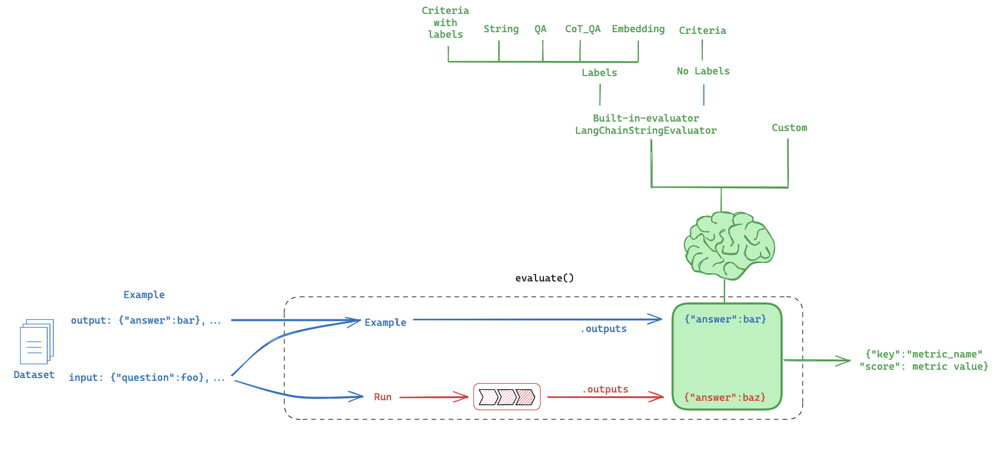

`Built-in evaluator`

https://docs.smith.langchain.com/evaluation/faq/evaluator-implementations

`CoT_qa`

```
Use chain of thought "reasoning" before determining a final verdict
```

In [ ]:
from langsmith.evaluation import evaluate, LangChainStringEvaluator

# Evaluators
qa_evalulator = [LangChainStringEvaluator("cot_qa")]
dataset_name = "DBRX"

experiment_results = evaluate(
    answer_dbrx_question_oai,
    data=dataset_name,
    evaluators=qa_evalulator,
    experiment_prefix="test-dbrx-qa-oai",
    # Any experiment metadata can be specified here
    metadata={
      "variant": "stuff website context into gpt-3.5-turbo",
    },
)

`What did we do?`

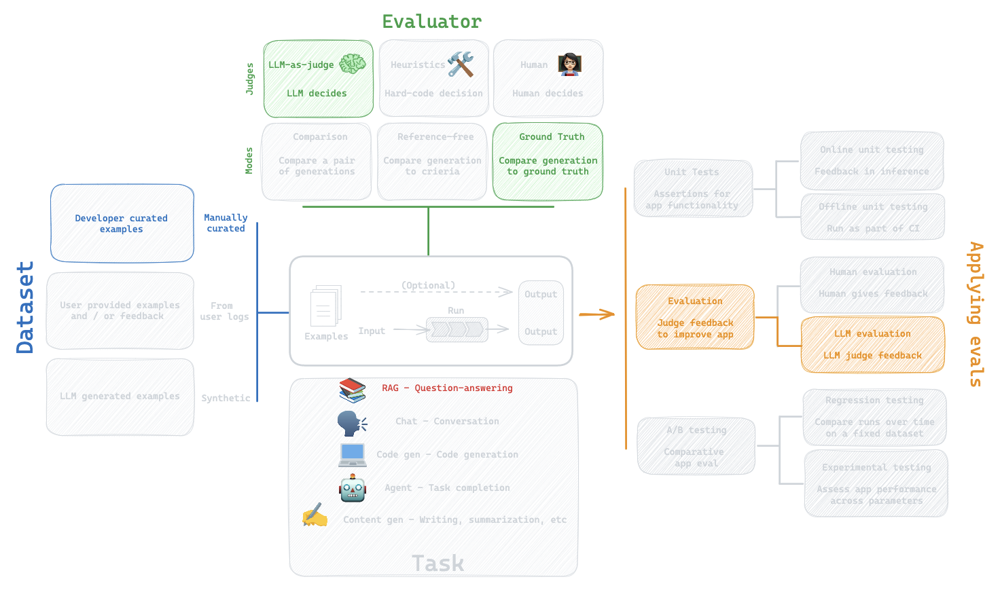

# 6. Custom evaluator

`Question:` 

How can I define my own custom evaluator? 

Let's say we want to define a simple assertion that an answer is actually generated.

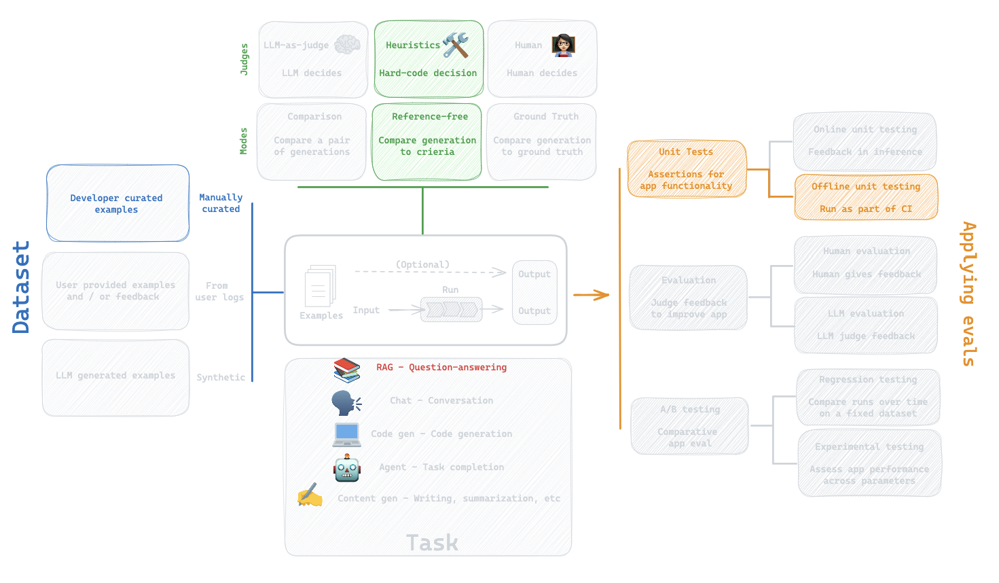

In [ ]:
from langsmith.schemas import Run, Example

def is_answered(run: Run, example: Example) -> dict: 

    # Get outputs
    student_answer = run.outputs.get("answer")
    
    # Check if the student_answer is an empty string
    if not student_answer:
        return {"key": "is_answered" , "score": 0} 
    else:
        return {"key": "is_answered" , "score": 1} 

# Evaluators
qa_evalulator = [is_answered]
dataset_name = "DBRX"

# Run
experiment_results = evaluate(
    answer_dbrx_question_oai,
    data=dataset_name,
    evaluators=qa_evalulator,
    experiment_prefix="test-dbrx-qa-custom-eval-is-answered",
    # Any experiment metadata can be specified here
    metadata={
      "variant": "stuff website context into gpt-3.5-turbo",
    },
)

# 7. Comparison 

`Question:` 

How does `Mistral-7b` running locally compare to `GPT-3.5-turbo` for question-answering?
 
`Setup:`

https://github.com/ollama/ollama-python

```
ollama pull mistral
```

Instrument Ollama calls with LangSmith: 

https://docs.smith.langchain.com/cookbook/tracing-examples/traceable#using-the-decorator

In [ ]:
# Mistral

import ollama
from langsmith.run_helpers import traceable

@traceable(run_type="llm")
def call_ollama(messages, model: str):
    stream = ollama.chat(messages=messages, model='mistral', stream=True)
    response = ''
    for chunk in stream:
        print(chunk['message']['content'], end='', flush=True)
        response =  response + chunk['message']['content'] 
    return response

def answer_dbrx_question_mistral(inputs: dict) -> dict:
    """
    Generates answers to user questions based on a provided website text using Ollama serving Mistral locally.

    Parameters:
    inputs (dict): A dictionary with a single key 'question', representing the user's question as a string.

    Returns:
    dict: A dictionary with a single key 'output', containing the generated answer as a string.
    """

    # System prompt 
    system_msg = f"Answer user questions about this context: \n\n\n {full_text}"
    
    # Pass in website text
    messages = [{"role": "system", "content": system_msg},
                {"role": "user", "content": f'Answer the question in 2-3 sentences {inputs["question"]}' }]

    # Call Mistral
    response = call_ollama(messages, model="mistral")

    # Response in output dict
    return {"answer": response} 

result = answer_dbrx_question_mistral({"question":"What are the main differences in training efficiency between MPT-7B vs DBRX?"})

What are we doing?

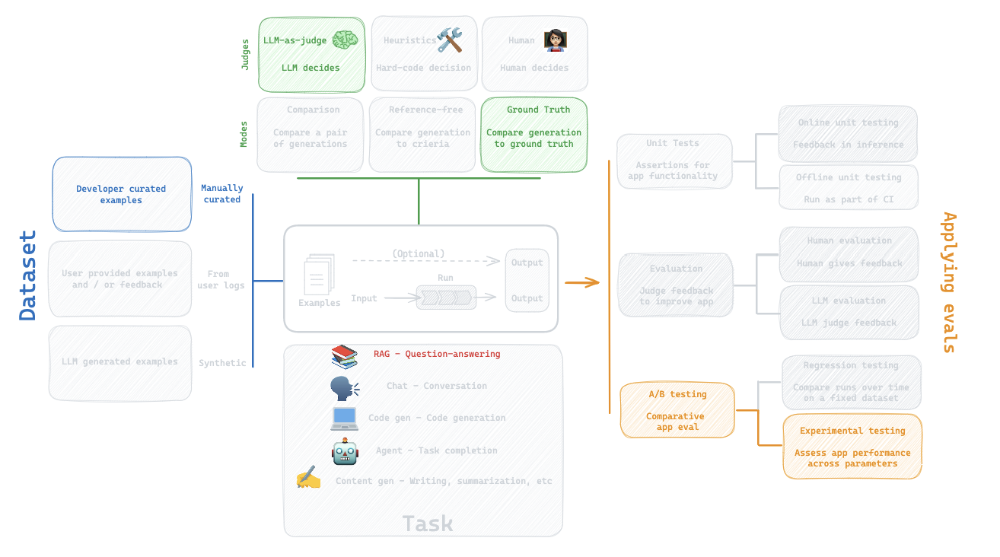

In [ ]:
# Evaluators
qa_evalulator = [LangChainStringEvaluator("cot_qa")]
dataset_name = "DBRX"

experiment_results = evaluate(
    answer_dbrx_question_mistral,
    data=dataset_name,
    evaluators=qa_evalulator,
    experiment_prefix="test-dbrx-qa-mistral",
    # Any experiment metadata can be specified here
    metadata={
      "variant": "stuff website context into mistral",
    },
)

Use comparison view to inspect results.

## 8. Experiment on datasets from the prompt playground (no code)

We've showed various ways to run evals using the SDK.
 
But sometimes I want to do more rapid testing.

For this I can use the LangSmith prompt hub directly: 

https://docs.smith.langchain.com/evaluation/faq/experiments-app

Here is a problem I've worked on recently: 

I want to grade documents in a RAG chain that takes as input: (1) A document and (2) A question.
 
And returns: (3) JSON with `score` yes or no that tells me if the documents are related to a question. 

See notebooks [here](https://github.com/langchain-ai/langgraph/tree/main/examples/rag).

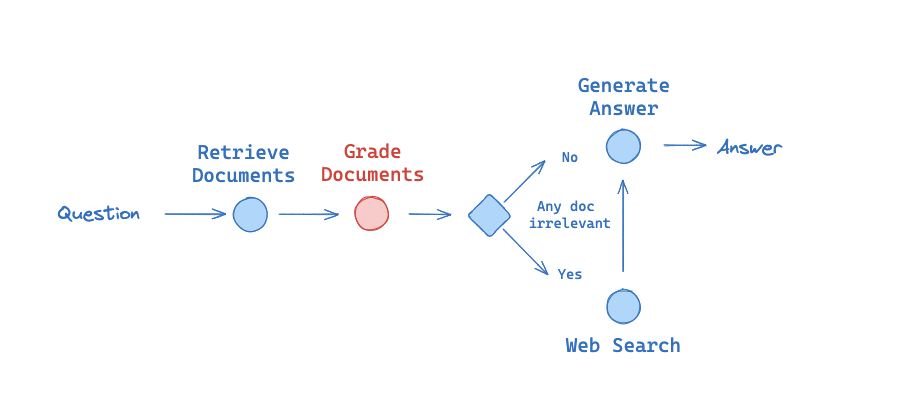

`Question:` 

How do different LLMs perform at instruction following to produce a JSON output?

First, I build a dataset of test examples:

In [14]:
# Define a dataset

import pandas as pd

# relevance check
inputs = [
    {"question":"agent memory","doc_txt":"agent memory has two types: short and long term"},
    {"question":"hallucinations","doc_txt":"DBRX was pretrained on 12T tokens"},
    {"question":"DBRX content window","doc_txt":"DBRX has a 32K token context window"},
]

outputs = [
    "yes",
    "no",
    "yes"
]

In [15]:
from langsmith import Client

client = Client()
dataset_name = "Relevance_grade"

# Store
dataset = client.create_dataset(
    dataset_name=dataset_name,
    description="Testing relevance grading.",
)
client.create_examples(
    inputs=inputs,
    outputs=[{"answer": a} for a in outputs],
    dataset_id=dataset.id,
)

Test prompt in the [Prompt Hub](https://smith.langchain.com/hub/rlm/score_documents?organizationId=1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8).

```
SYSTEM

You are a grader assessing relevance of a retrieved document to a user question. It does not need to be a stringent test. The goal is to filter out erroneous retrievals. If the document contains keyword(s) or semantic meaning related to the user question, grade it as relevant. Give a binary score 'yes' or 'no' score to indicate whether the document is relevant to the question. Provide the binary score as a JSON with a single key 'score' and no premable or explaination.

HUMAN

Question: {question} 

Document: {doc_txt}
```

## 9. Attach evaluators to datasets (no code)

From part 8, we:

(1) Set up a dataset of test cases for document grading 

(2) Ran experiments from the prompt hub

(3) Manually reviewed them

But, we can go one step further:

We can attach an LLM evaluator to our dataset. 

This is automatically applied for every experiment.

Grade prompt:

```
You are a grader. You will be shown: 

(1) Submission: a student submission for a JSON string

(2) Reference: the ground truth value expected in the JSON string

The student is producing a JSON with a single key "score" to indicate whether doc_text is relevant to question for this input:

[Input]: {input}

Grade the student as correct if that the student submission is valid JSON (or a JSON string) and contains the Reference value. If the student submission contains a preamble of text "e.g., 'sure, here is the JSON'" then score that as incorrect because we only want to JSON returned.

[BEGIN DATA]

***

[Submission]: {output}

***

[Reference]: {reference}

***

[END DATA]
```

## 10. Instrumenting Unit Tests

Unit tests are often simple assertions that are run as part of CI. 

`Example`:

I've some recent work on code generation (e.g., see [this](https://github.com/langchain-ai/langgraph/blob/main/examples/code_assistant/langgraph_code_assistant.ipynb) example).

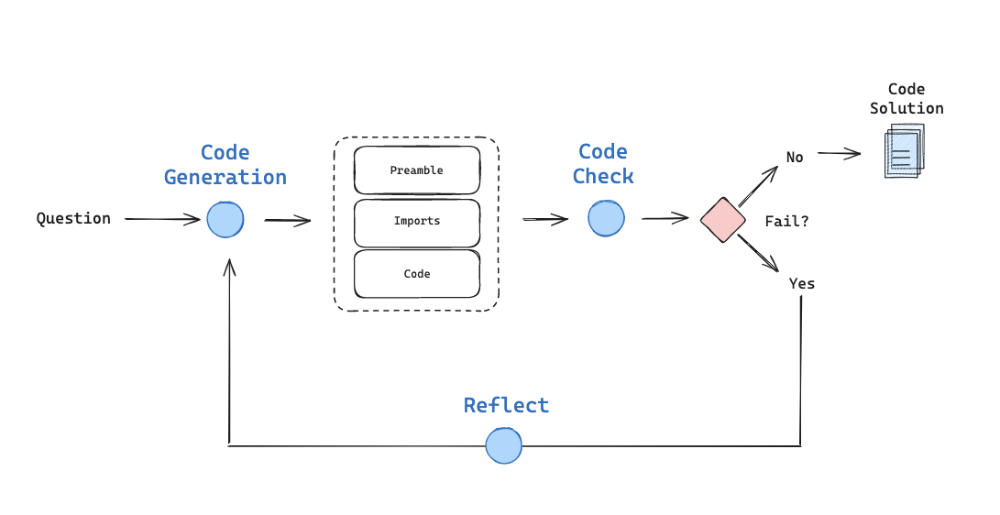

I use function calling to produce a solution with `prefix`, `imports`, and `code` blocks.


`Question`:

How can I instrument unit tests that check whether the `imports` and `code` blocks execute?

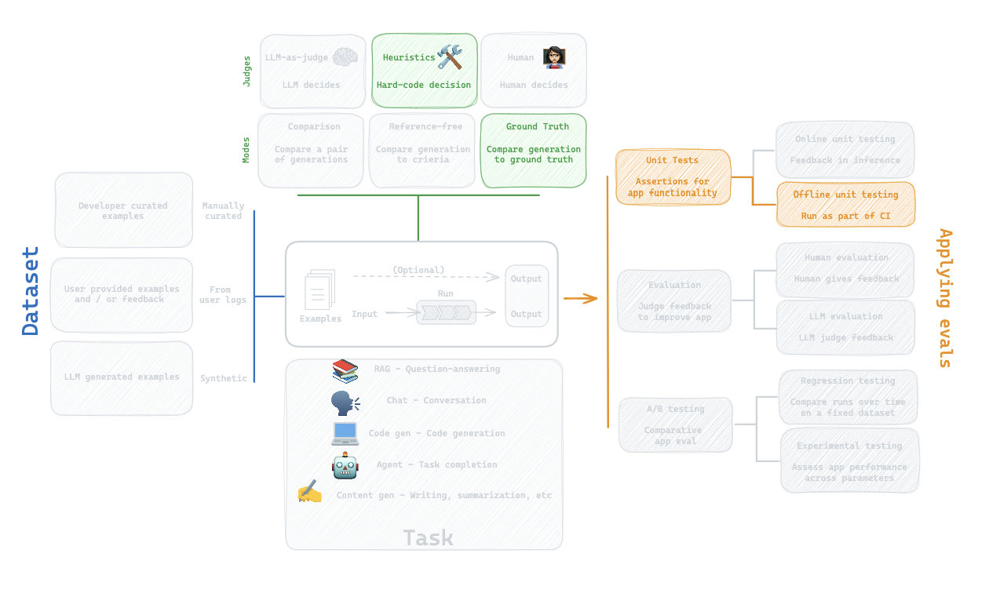

We'll create an example app, `my_app/main.py`, that generate a solution with `prefix`, `imports`, and `code` blocks.

Set up example app and test - 

```
# my_app/main.py
# tests/test_my_app.py
```

Run - 

```
export PYTHONPATH="/Users/rlm/Desktop/Code/langsmith-cookbook:$PYTHONPATH"
pytest
```

See results logged to LangSmith.

Documentation: 

https://docs.smith.langchain.com/evaluation/faq/unit-testing

## 11. Summary Evaluators

We previously talked about using retrieval grading as part of RAG:

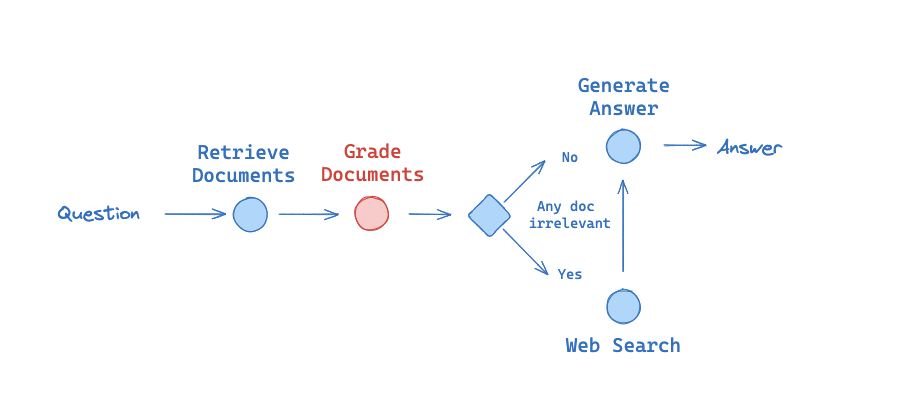

In short, we use an LLM to grader whether a document is relevant to input question.

This returns a binary `yes` or `no`.

We built an eval set and ground truth is a binary `yes` or `no` for each example:

https://smith.langchain.com/public/ad300ffb-8bf5-450a-9c26-1b34481fb709/d

`Question:`

How can I create a custom metric to summarize performance on this dataset?

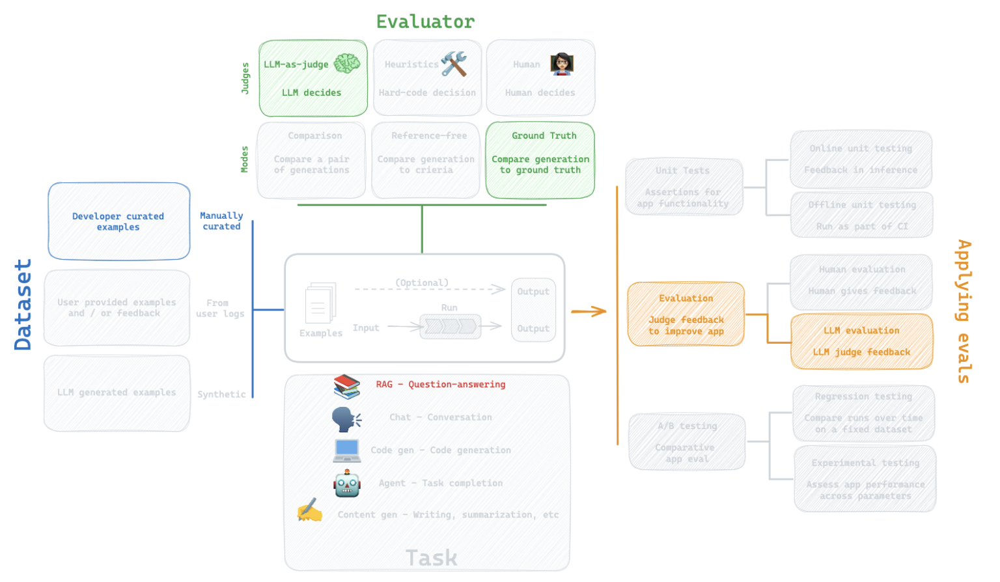

First, let's set up the two chains we want to compare:

* [OpenAI w/ tool use](https://github.com/langchain-ai/langgraph/blob/e779b4335b8a8b11c9e8ac71b89e9a08a94e3ff9/examples/rag/langgraph_self_rag.ipynb)
* [Mistral w/ JSON mode running locally](https://github.com/langchain-ai/langgraph/blob/e779b4335b8a8b11c9e8ac71b89e9a08a94e3ff9/examples/rag/langgraph_self_rag_local.ipynb) 

In [7]:
### OpenAI Grader

from langchain_openai import ChatOpenAI
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.pydantic_v1 import BaseModel, Field

# Data model
class GradeDocuments(BaseModel):
    """Binary score for relevance check on retrieved documents."""

    score: str = Field(description="Documents are relevant to the question, 'yes' or 'no'")

# LLM with function call 
llm = ChatOpenAI(model="gpt-3.5-turbo-0125", temperature=0)
structured_llm_grader = llm.with_structured_output(GradeDocuments)

# Prompt 
system = """You are a grader assessing relevance of a retrieved document to a user question. \n 
    It does not need to be a stringent test. The goal is to filter out erroneous retrievals. \n
    If the document contains keyword(s) or semantic meaning related to the user question, grade it as relevant. \n
    Give a binary score 'yes' or 'no' score to indicate whether the document is relevant to the question."""
grade_prompt = ChatPromptTemplate.from_messages(
    [
        ("system", system),
        ("human", "Retrieved document: \n\n {document} \n\n User question: {question}"),
    ]
)

retrieval_grader_oai = grade_prompt | structured_llm_grader

def predict_oai(inputs: dict) -> dict:

    # Returns pydantic object
    grade = retrieval_grader_oai.invoke({"question": inputs["question"], "document": inputs["doc_txt"]})
    return {"grade":grade.score}

In [8]:
### Mistral Grader

from langchain.prompts import PromptTemplate
from langchain_community.chat_models import ChatOllama
from langchain_core.output_parsers import JsonOutputParser

# LLM
llm = ChatOllama(model="mistral", format="json", temperature=0)

prompt = PromptTemplate(
    template="""You are a grader assessing relevance of a retrieved document to a user question. \n 
    Here is the retrieved document: \n\n {document} \n\n
    Here is the user question: {question} \n
    If the document contains keywords related to the user question, grade it as relevant. \n
    It does not need to be a stringent test. The goal is to filter out erroneous retrievals. \n
    Give a binary score 'yes' or 'no' score to indicate whether the document is relevant to the question. \n
    Provide the binary score as a JSON with a single key 'score' and no premable or explaination.""",
    input_variables=["question", "document"],
)

retrieval_grader_mistral = prompt | llm | JsonOutputParser()

def predict_mistral(inputs: dict) -> dict:

    # Returns JSON
    grade = retrieval_grader_mistral.invoke({"question": inputs["question"], "document": inputs["doc_txt"]})
    return {"grade":grade['score']}

Documentation: 

https://docs.smith.langchain.com/evaluation/faq/custom-evaluators#summary-evaluators

We can define a custom summary metric over the dataset.

[`Precision` and `Recall` are common metrics to evaluate a binary clasification](https://en.wikipedia.org/wiki/Precision_and_recall):

* `Precision`: True positives (`TP`) / All positives (`TP + False Positives (FP)`).
* `Recall`: `TP` / All samples that should have been identified as positive

`F1` considers both the precision and the recall of the test to compute the score:
* `F1` score is the harmonic mean of precision and recall, and it reaches its best value at 1 

In [7]:
from typing import List
from langsmith.schemas import Example, Run
from langsmith.evaluation import evaluate

def f1_score_summary_evaluator(runs: List[Run], examples: List[Example]) -> dict:
    """
    Evaluates the F1 score for a list of runs against a set of examples.

    The function iterates through paired runs and examples, comparing the output
    of each run (`run.outputs["grade"]`) with the expected output in the example
    (`example.outputs["answer"]`). It calculates the true positives, false positives,
    and false negatives based on these comparisons to compute the F1 score of the predictions.

    Parameters:
    - runs (List[Run]): A list of run objects, where each run contains an output that is a prediction.
    - examples (List[Example]): A list of example objects, where each example contains an output that is the expected answer.

    Returns:
    - dict: A dictionary with a single key-value pair where the key is "f1_score" and the value 
    """

    # Default values
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    
    # Iterate through samples
    for run, example in zip(runs, examples):
        reference = example.outputs["answer"]
        prediction = run.outputs["grade"]
        if reference and prediction == reference:
            true_positives += 1
        elif prediction and not reference:
            false_positives += 1
        elif not prediction and reference:
            false_negatives += 1
    if true_positives == 0:
        return {"key": "f1_score", "score": 0.0}
        
    # Compute F1 score
    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    f1_score = 2 * (precision * recall) / (precision + recall)
    return {"key": "f1_score", "score": f1_score}

In [10]:
evaluate(
    predict_mistral,
    data="Relevance_grade",
    summary_evaluators=[f1_score_summary_evaluator],
    experiment_prefix="test-score-mistral",
    # Any experiment metadata can be specified here
    metadata={
      "model": "mistral",
    },
)

View the evaluation results for experiment: 'test-score-mistral-c288bf9f' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/1627c2dc-8207-44a1-86a3-bc7e23bd9777/compare?selectedSessions=f6a22a99-5e13-47d5-916a-cdd6b1a0ea38




0it [00:00, ?it/s]

<ExperimentResults test-score-mistral-c288bf9f>

In [11]:
evaluate(
    predict_oai,
    data="Relevance_grade",
    summary_evaluators=[f1_score_summary_evaluator],
    experiment_prefix="test-score-oai",
    # Any experiment metadata can be specified here
    metadata={
      "model": "oai",
    },
)

View the evaluation results for experiment: 'test-score-oai-dccbb67b' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/1627c2dc-8207-44a1-86a3-bc7e23bd9777/compare?selectedSessions=1614d57e-3152-41a9-98e2-ba23c12a0439




0it [00:00, ?it/s]

<ExperimentResults test-score-oai-dccbb67b>

# 12-14. Evaluating RAG

See our [RAG guide](https://docs.smith.langchain.com/cookbook/testing-examples/rag_eval).

In [38]:
# Evaluators
qa_evalulator = [LangChainStringEvaluator("cot_qa")]
dataset_name = "RAG_test_LCEL"
    
experiment_results = evaluate(
    predict_rag_answer,
    data=dataset_name,
    evaluators=qa_evalulator,
    experiment_prefix="rag-qa-oai",
    # Any experiment metadata can be specified here
    metadata={
      "variant": "LCEL context, gpt-3.5-turbo",
    },
)

View the evaluation results for experiment: 'rag-qa-oai-166e3567' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/368734fb-7c14-4e1f-b91a-50d52cb58a07/compare?selectedSessions=bc8c1195-1722-4ec9-9b18-45b76c648717




0it [00:00, ?it/s]

# 15. Regression testing

Previously, we talked about various types of RAG evaluations.

`Question:` 

How can I assess whether a new LLM (e.g., phi3), can I be used in my RAG chain?

For this, regression testing is highly useful.

It lets us easily pinpoint changes in performance in our eval set across model versions.

First, define an eval set:

In [ ]:
from langsmith import Client 

# QA
inputs = [
    "My LCEL map contains the key 'question'. What is the difference between using itemgetter('question'), lambda x: x['question'], and x.get('question')?",
    "How can I make the output of my LCEL chain a string?",
    "How can I run two LCEL chains in parallel and write their output to a map?"
]

outputs = [
    "Itemgetter can be used as shorthand to extract specific keys from the map. In the context of a map operation, the lambda function is applied to each element in the input map and the function returns the value associated with the key 'question'. (get) is safer for accessing values in a dictionary because it handles the case where the key might not exist.",
    "Use StrOutputParser. from langchain_openai import ChatOpenAI; from langchain_core.prompts import ChatPromptTemplate; from langchain_core.output_parsers import StrOutputParser; prompt = ChatPromptTemplate.from_template('Tell me a short joke about {topic}'); model = ChatOpenAI(model='gpt-3.5-turbo') #gpt-4 or other LLMs can be used here; output_parser = StrOutputParser(); chain = prompt | model | output_parser",
    "We can use RunnableParallel. For example: from langchain_core.prompts import ChatPromptTemplate; from langchain_core.runnables import RunnableParallel; from langchain_openai import ChatOpenAI; model = ChatOpenAI(); joke_chain = ChatPromptTemplate.from_template('tell me a joke about {topic}') | model; poem_chain = (ChatPromptTemplate.from_template('write a 2-line poem about {topic}') | model); map_chain = RunnableParallel(joke=joke_chain, poem=poem_chain); map_chain.invoke({'topic': 'bear'})"
]

qa_pairs = [{"question": q, "answer": a} for q, a in zip(inputs, outputs)]

# Create dataset
client = Client()
dataset_name = "RAG_QA_LCEL"
dataset = client.create_dataset(
    dataset_name=dataset_name,
    description="QA pairs about LCEL.",
)
client.create_examples(
    inputs=[{"question": q} for q in inputs],
    outputs=[{"answer": a} for a in outputs],
    dataset_id=dataset.id,
)

RAG chain:

In [1]:
### INDEX

from bs4 import BeautifulSoup as Soup
from langchain_community.vectorstores import Chroma
from langchain_openai import OpenAIEmbeddings
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders.recursive_url_loader import RecursiveUrlLoader

# Load
url = "https://python.langchain.com/v0.1/docs/expression_language/"
loader = RecursiveUrlLoader(url=url, max_depth=20, extractor=lambda x: Soup(x, "html.parser").text)
docs = loader.load()
full_doc_text = ' ---- '.join([d.page_content for d in docs])

# Split
text_splitter = RecursiveCharacterTextSplitter(chunk_size=4000, chunk_overlap=200)
splits = text_splitter.split_documents(docs)

# Embed
vectorstore = Chroma.from_documents(documents=splits, embedding=OpenAIEmbeddings())

# Index
retriever = vectorstore.as_retriever()

In [6]:
### RAG 

import openai
from langsmith import traceable
from langsmith.wrappers import wrap_openai
from langchain.prompts import PromptTemplate
from langchain_community.chat_models import ChatOllama
from langchain_core.output_parsers import StrOutputParser

class RagBot:
    """
    A class to interface with retrieval-augmented generation (RAG) models from different providers
    such as OpenAI or Ollama, utilizing a retriever for document-based context.
    """
    def __init__(self, 
                 retriever, 
                 provider: str = "openai", 
                 model: str = "gpt-4-0125-preview",
                 use_vectorstore: bool = True):
        """
        Initializes the RagBot with a retriever, provider information, model details, and configuration
        to use a vector store for document retrieval.
        
        Args:
        retriever: The document retriever instance.
        provider (str): The provider of the RAG model ('openai' or 'ollama').
        model (str): The model identifier used by the provider.
        use_vectorstore (bool): Flag to determine whether to use vectorstore for document retrieval.
        """
        self._retriever = retriever
        self._provider = provider
        self._model = model
        self._use_vectorstore = use_vectorstore
        if provider == "openai":
            self._client = wrap_openai(openai.Client())
        elif provider == "ollama":
            self._client = ChatOllama(model=model, temperature=0)

    @traceable()
    def retrieve_docs(self, question):
        """
        Retrieves documents based on the input question, using either a vectorstore or full context.
        
        Args:
        question (str): The question to retrieve documents for.
        
        Returns:
        list: A list of documents relevant to the question or the full context (as a string).
        """
        if self._use_vectorstore:
            return self._retriever.invoke(question)
        else:
            return full_doc_text

    @traceable()
    def get_answer(self, question: str):
        """
        Generates an answer for a given question by using RAG, leveraging both the retriever
        and the provider's model capabilities.
        
        Args:
        question (str): The user's question to answer.
        
        Returns:
        dict: A dictionary containing the 'answer' and 'contexts' (related documents).
        """
        similar = self.retrieve_docs(question)
        if self._provider == "openai":
            "OpenAI RAG"
            response = self._client.chat.completions.create(
                model=self._model,
                messages=[
                    {
                        "role": "system",
                        "content": "You are a helpful AI code assistant with expertise in LCEL.\n"
                        " Use the following docs to produce a concise code solution to the user question.\n"
                        " Use three sentences maximum and keep the answer concise. \n"
                        f"## Docs\n\n{similar}",
                    },
                    {"role": "user", "content": question},
                ],
            )
            response_str = response.choices[0].message.content
            
        elif self._provider == "ollama":
            "Ollama RAG"
            prompt = PromptTemplate(
                template="""You are a helpful AI code assistant with expertise in LCEL.
                Use the following docs to produce a concise code solution to the user question.
                If you don't know the answer, just say that you don't know. 
                Use three sentences maximum and keep the answer concise.
                Question: {question} 
                Context: {context} 
                Answer: """,
                input_variables=["question", "context"],
            )
            rag_chain = prompt | self._client | StrOutputParser()    
            response_str = rag_chain.invoke({"context":similar,"question":question})

        return {
            "answer": response_str,
            "contexts": [str(doc) for doc in similar],
        }

In [2]:
def predict_rag_answer_oai(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="openai",model="gpt-4-0125-preview")
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

def predict_rag_answer_llama3(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="ollama",model="llama3")
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

def predict_rag_answer_phi3(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="ollama",model="phi3")
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

Define evaluator:

Note, the evaluator is checked in here: 

https://smith.langchain.com/hub/langchain-ai/rag-answer-accuracy/

In [3]:
from langchain_openai import ChatOpenAI
from langsmith.schemas import Example, Run
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.pydantic_v1 import BaseModel, Field
from langsmith.evaluation import LangChainStringEvaluator, evaluate

def answer_evaluator(root_run: Run, example: Example) -> dict:
    """
    A simple evaluator for RAG answer generation
    """

    # Get question, answer, and reference answer 
    rag_pipeline_run = next(run for run in root_run.child_runs if run.name == "get_answer")
    retrieve_run = next(run for run in rag_pipeline_run.child_runs if run.name == "retrieve_docs")
    input_question = example.inputs["question"]
    reference = example.outputs["answer"]
    prediction = rag_pipeline_run.outputs["answer"]

    # Data model for grade
    class GradeAnswer(BaseModel):
        """A numerical score for answer accuracy."""
        score: int = Field(description="Answer matches the grond truth, score from 1 to 10")
    
    # LLM with function call, use highest capacity model 
    llm = ChatOpenAI(model="gpt-4-turbo", temperature=0) # 
    structured_llm_grader = llm.with_structured_output(GradeAnswer)
    
    # Prompt 
    system = """Is the Assistant's Answer grounded in and similar to the Ground Truth answer. Note that we do not expect all of the text 
            in code solution examples to be identical. We expect (1) code imports to be identical if the same import is used. (2) But, it is
            ok if there are differences in the implementation itself. The main point is that the same concept is employed. A score of 1 means 
            that the Assistant answer is not at all conceptically grounded in and similar to the Ground Truth answer. A score of 5 means  that the Assistant 
            answer contains some information that is conceptically grounded in and similar to the Ground Truth answer. A score of 10 means that the 
            Assistant answer is fully conceptically grounded in and similar to the Ground Truth answer."""
    
    grade_prompt = ChatPromptTemplate.from_messages(
        [
            ("system", system),
            ("human", "Ground Truth answer: \n\n {reference} \n\n Assistant's Answer: {prediction}"),
        ]
    )
    
    answer_grader = grade_prompt | structured_llm_grader
    score = answer_grader.invoke({"reference": reference, "prediction": prediction})
    return {"key": "answer_accuracy", "score": int(score.score) / 10}

#### Compare OpenAI vs Ollama (open source LLMs)

In [25]:
from langsmith.evaluation import LangChainStringEvaluator, evaluate

dataset_name = "RAG_QA_LCEL"
experiment_results = evaluate(
    predict_rag_answer_oai,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-gpt4-0125",
    metadata={"variant": "LCEL context, gpt-4-0125-preview"},
)

View the evaluation results for experiment: 'rag-qa-gpt4-0125-6b799ce4' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/185fcfba-a9cb-4868-9904-86644881d363/compare?selectedSessions=98981d76-b10f-4856-b6be-ed86f035b34c




0it [00:00, ?it/s]

In [26]:
experiment_results = evaluate(
    predict_rag_answer_llama3,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-llama3",
    metadata={"variant": "LCEL context, gpt-4-0125-preview"},
)

View the evaluation results for experiment: 'rag-qa-llama3-ad040c84' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/185fcfba-a9cb-4868-9904-86644881d363/compare?selectedSessions=c78dc2a7-b99c-48bf-9613-70fe53dae303




0it [00:00, ?it/s]

In [27]:
experiment_results = evaluate(
    predict_rag_answer_phi3,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-phi3",
    metadata={"variant": "LCEL context, phi3"},
)

View the evaluation results for experiment: 'rag-qa-phi3-d8ebf147' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/185fcfba-a9cb-4868-9904-86644881d363/compare?selectedSessions=a71ffea1-b2b2-4e3b-963f-5f31de646083




0it [00:00, ?it/s]

#### Regression Testing: Compare OpenAI model versions

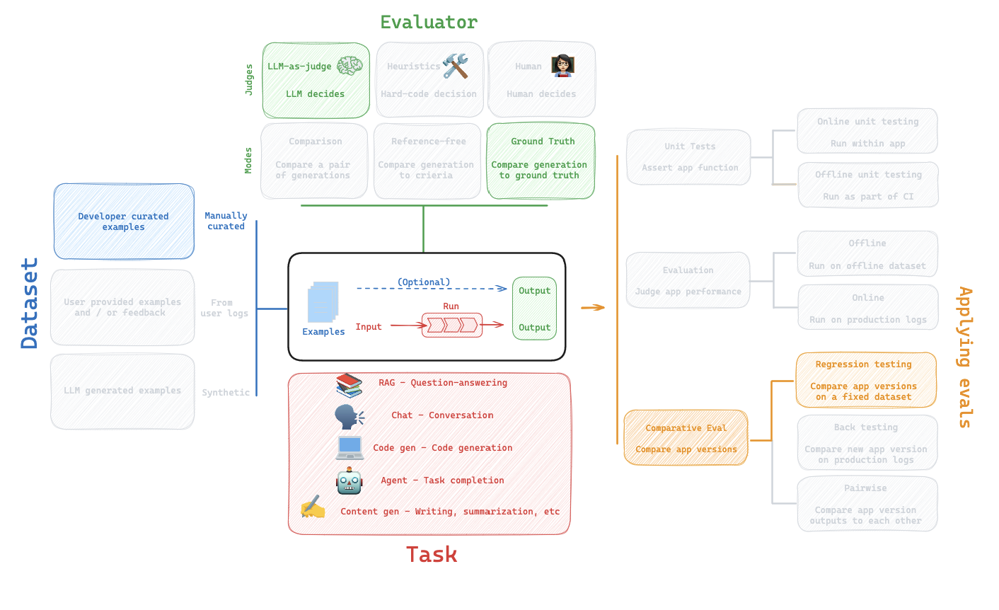

Models - 
* https://openai.com/index/hello-gpt-4o/
* https://platform.openai.com/docs/models/gpt-4-turbo-and-gpt-4
 
Run this on somewhat challebnging set of LCEL questions - 
* https://smith.langchain.com/public/ea1f6ca5-de52-4d36-bd7b-fde3faa74a70/d

In [7]:
### Chains to test

def predict_rag_answer_gpt4_1106_vectorstore(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="openai",model="gpt-4-1106-preview",use_vectorstore=True)
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

def predict_rag_answer_gpt4_1106(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="openai",model="gpt-4-1106-preview",use_vectorstore=False)
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

def predict_rag_answer_gpt4turbo_vectorstore(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="openai",model="gpt-4-turbo",use_vectorstore=True)
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

def predict_rag_answer_gpt4turbo(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="openai",model="gpt-4-turbo",use_vectorstore=False)
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

def predict_rag_answer_gpt4o(example: dict):
    """Use this for answer evaluation"""
    rag_bot = RagBot(retriever,provider="openai",model="gpt-4o",use_vectorstore=False)
    response = rag_bot.get_answer(example["question"])
    return {"answer": response["answer"]}

### Dataset

dataset_name = "lcel-eval"

In [75]:
experiment_results = evaluate(
    predict_rag_answer_gpt4_1106,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-gpt4-1106",
    metadata={"variant": "LCEL context, gpt4-1106"},
)

experiment_results = evaluate(
    predict_rag_answer_gpt4turbo,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-gpt4-turbo",
    metadata={"variant": "LCEL context, gpt4-turbo"},
)

experiment_results = evaluate(
    predict_rag_answer_gpt4_1106_vectorstore,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-gpt4-1106-vectorstore",
    metadata={"variant": "LCEL context, gpt4-1106-vectorstore"},
)

experiment_results = evaluate(
    predict_rag_answer_gpt4turbo_vectorstore,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-gpt4-turbo-vectorstore",
    metadata={"variant": "LCEL context, gpt4-turbo-vectorstore"},
)

View the evaluation results for experiment: 'rag-qa-gpt4-1106-d7a86cae' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/fd4dbaa7-461e-4e7a-a0cf-846fd0af181c/compare?selectedSessions=bb38c0e5-f24a-4c71-b24c-b2c0b37b34b7




0it [00:00, ?it/s]

View the evaluation results for experiment: 'rag-qa-gpt4-turbo-0506902e' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/fd4dbaa7-461e-4e7a-a0cf-846fd0af181c/compare?selectedSessions=327ba56b-e49c-4f3a-8f57-46d22d1ab35a




0it [00:00, ?it/s]

View the evaluation results for experiment: 'rag-qa-gpt4-1106-vectorstore-6760450f' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/fd4dbaa7-461e-4e7a-a0cf-846fd0af181c/compare?selectedSessions=81fcf550-736e-43bf-b1a4-a5f6b77796bd




0it [00:00, ?it/s]

View the evaluation results for experiment: 'rag-qa-gpt4-turbo-vectorstore-3417b709' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/fd4dbaa7-461e-4e7a-a0cf-846fd0af181c/compare?selectedSessions=c2ebdb94-19e1-4889-9528-0285b8c8a000




0it [00:00, ?it/s]

In [5]:
experiment_results = evaluate(
    predict_rag_answer_gpt4o,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="rag-qa-gpt4o",
    metadata={"variant": "LCEL context, gpt4o"},
)

View the evaluation results for experiment: 'rag-qa-gpt4o-2cc85e63' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/fd4dbaa7-461e-4e7a-a0cf-846fd0af181c/compare?selectedSessions=72a0c3c3-6a74-4da3-8de9-ac40bf0d85e7




0it [00:00, ?it/s]

/Users/rlm/miniforge3/envs/llama2/lib/python3.11/site-packages/langchain_core/_api/beta_decorator.py:87: LangChainBetaWarning: The method `ChatOpenAI.with_structured_output` is in beta. It is actively being worked on, so the API may change.
  warn_beta(


## 16. Online Evaluators

Sometimes we want to evaluate generations as they are logged to a project.

There are a few common applications for online evaluation:

* [RAG: answer hallucinations](https://smith.langchain.com/hub/rlm/rag-answer-hallucination?organizationId=1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8)
* [RAG: document relevance](https://smith.langchain.com/hub/rlm/rag-document-relevance/playground?organizationId=1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8&type=structured)

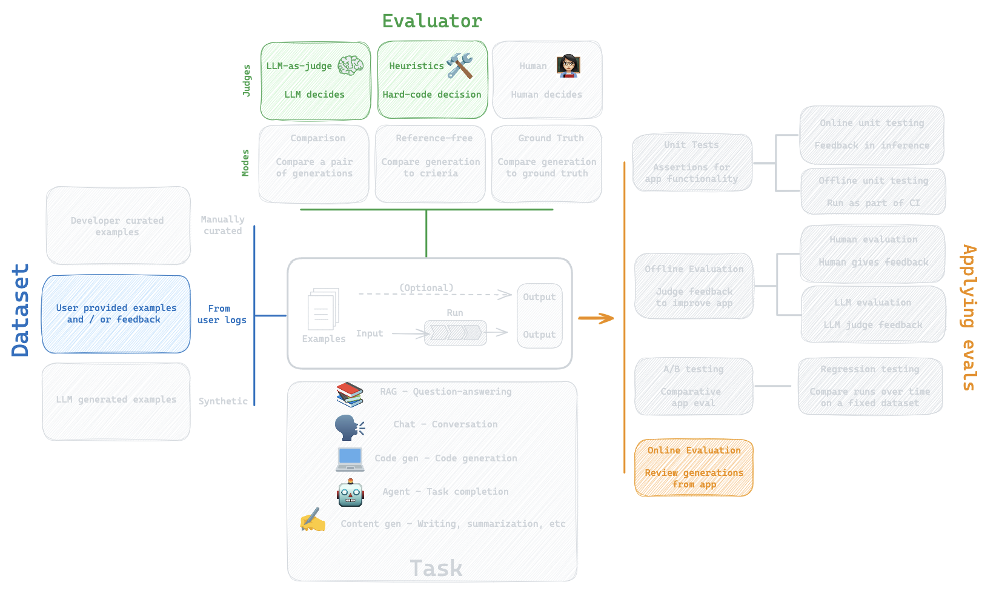

In [86]:
import os
os.environ['LANGCHAIN_PROJECT'] = 'RAG_online_eval'

In [99]:
import openai
from langsmith import traceable, Client
import uuid

client = openai.Client()

@traceable(
    run_type="chain",
    name="rag",
)
def rag(
    question: str,
    documents
):
    return client.chat.completions.create(
        model="gpt-3.5-turbo",
        temperature=0,
        messages=[
            {
                "role": "system",
                "content": f"Answer questions based on these documents: {documents}"
            },
            {
                "role": "user",
                "content": question
            }
        ],
    ).choices[0].message.content

rag("where did harrison work", ['ankush and his friend worked at kensho'])

'Harrison worked at Kensho.'

In [100]:
rag("where did ankush work", ['ankush and his friend worked at kensho'])

'Ankush worked at Kensho.'

In [101]:
rag("where did lance work", ['ankush and his friend worked at kensho'])

'Lance worked at Kensho.'

### 17. Back-testing

Let's assume one of our RAG apps above, `predict_rag_answer_gpt4turbo_vectorstore`, was deployed.

We've collected production logs from users.

`Question:` 

What if I want to test a new app version (e.g., a different LLM) on my user logs?

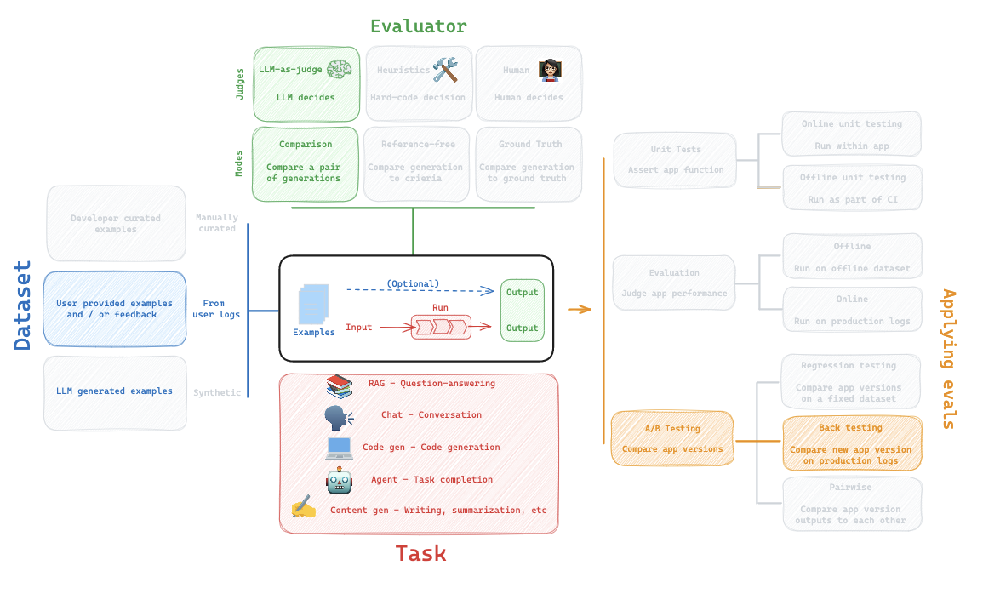

This is where back-testing comes into play!

https://docs.smith.langchain.com/cookbook/testing-examples/backtesting

In [17]:
import os
project_name = 'back_testing_v2'
os.environ['LANGCHAIN_PROJECT'] = project_name

In [18]:
# Running the app 
predict_rag_answer_gpt4turbo_vectorstore({"question": "How can I define a RAG chain in LCEL?"})

{'answer': 'To define a RAG (Retrieval-Augmented Generation) chain in LCEL, you must set up a retriever and a generator model and wire them together using the LCEL syntax. First, install the necessary packages (`langchain`, `langchain-openai` etc.) and set up a retriever (like using FAISS for vector storage). Then, create a prompt template interpreting the context to the question, use the retrieved context as input to a generator model like OpenAI\'s GPT, and finally, parse the model output. Here is a brief example:\n\n```python\nfrom langchain_openai import ChatOpenAI, OpenAIEmbeddings\nfrom langchain_core import ChatPromptTemplate, StrOutputParser\nfrom langchain_community.vectorstores import FAISS\n\n# Embedding and retriever setup\nvectorstore = FAISS.from_texts(["document text here"], embedding=OpenAIEmbeddings())\nretriever = vectorstore.as_retriever()\n\n# Define prompt and model\ntemplate = "Given the context: {context} \\nAnswer the question: {question}"\nprompt = ChatPromptTe

In [19]:
predict_rag_answer_gpt4turbo_vectorstore({"question": "How can I run two chains in parallel?"})

{'answer': 'To run two chains in parallel using LangChain, you create separate chain instances using `ChatPromptTemplate.from_template()` combined with a model, and then use `RunnableParallel` to combine them. For example:\n\n```python\nfrom langchain_core.runnables import RunnableParallel, ChatPromptTemplate\n\nchain1 = ChatPromptTemplate.from_template("tell me a joke about {topic}") | model\nchain2 = ChatPromptTemplate.from_template("write a short (2 line) poem about {topic}") | model\ncombined = RunnableParallel(joke=chain1, poem=chain2)\n\nresult = combined.invoke({"topic": "bears"})\n```\n\nThis will execute both `chain1` and `chain2` in parallel when you invoke `combined.invoke()`, giving you the outputs from both simultaneously.'}

In [20]:
predict_rag_answer_gpt4turbo_vectorstore({"question": "How can I get the output schema of a chain?"})

{'answer': 'To obtain the output schema of a chain, you can use the `.output_schema.schema()` method on the chain object. The output schema will represent the schema of the last component in the chain, detailing various potential message types like `AIMessage`, `HumanMessage`, and others as defined in the JSONSchema representation. This schema provides information on the expected structure and data types of the output from the chain.'}

In [21]:
predict_rag_answer_gpt4turbo_vectorstore({"question": "How can I make the output of my LCEL chain a string?"})

{'answer': 'To make the output of your LCEL chain a string, you can use the `StrOutputParser` component in your chain. This component is designed to parse the output from the prior element in the chain into a string format. Here is an example of how to integrate it into your LCEL chain: `chain = prompt | model | StrOutputParser()`.'}

In [22]:
predict_rag_answer_gpt4turbo_vectorstore({"question": "How can I include an arbirary function in my chain?"})

{'answer': "To include an arbitrary function in your chain using LangChain's Lambda functionality, define a wrapper that accepts a single input and unpacks it into multiple arguments if necessary. This is because all inputs to Lambda functions must be a single argument. You can then place the Lambda custom function within the execution pipeline wherever needed."}

Now, we can create a dataset from these example runs.

We'll just save the inputs.

In [23]:
from datetime import datetime, timedelta, timezone

from langsmith import Client
from langsmith.beta import convert_runs_to_test

# Sample runs
end_time = datetime.now(tz=timezone.utc)
start_time = end_time - timedelta(days=1)
run_filter = f'and(gt(start_time, "{start_time.isoformat()}"), lt(end_time, "{end_time.isoformat()}"))'

# Fetch the runs we want to convert to a test
client = Client()

# Get prod runs from our project
prod_runs = list(
    client.list_runs(
        project_name=project_name,
        execution_order=1,
        filter=run_filter,
    )
)

# Name of the dataset we want to create
dataset_name = f'{project_name}-backtesting {start_time.strftime("%Y-%m-%d")}-{end_time.strftime("%Y-%m-%d")}'

# This converts the runs to a dataset + test
convert_runs_to_test(
    prod_runs,
    # Name of the resulting dataset
    dataset_name=dataset_name,
    # Whether to include the run outputs as reference/ground truth
    include_outputs=False,
    # Whether to include the full traces in the resulting test project
    # (default is to just include the root run)
    load_child_runs=True,
)

/var/folders/l9/bpjxdmfx7lvd1fbdjn38y5dh0000gn/T/ipykernel_51770/3795586114.py:27: UserWarning: Function convert_runs_to_test is in beta.
  convert_runs_to_test(


TracerSession(id=UUID('98355969-63bd-41b8-8f82-7b577114703d'), start_time=datetime.datetime(2024, 5, 9, 23, 35, 5, 267822), end_time=None, description=None, name='prod-baseline-bac92e', extra={'metadata': {'which': 'prod-baseline', 'dataset_version': '2024-05-09T23:34:59.561286+00:00'}}, tenant_id=UUID('1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8'), reference_dataset_id=UUID('a55d2e6d-ce3f-45a9-86b8-5c0e182e0e65'))

Now, let's re-test with a new model variant: `predict_rag_answer_gpt4turbo`. 

This will use context stuffing rather than RAG.

In [24]:
from langsmith.evaluation import evaluate

test_results = evaluate(
    predict_rag_answer_gpt4turbo, 
    data=dataset_name, 
    experiment_prefix="GPT4-Turbo", 
    max_concurrency=3
)

View the evaluation results for experiment: 'GPT4-Turbo-623c0264' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/a55d2e6d-ce3f-45a9-86b8-5c0e182e0e65/compare?selectedSessions=02919e84-f240-425d-81ca-ea4edda3b50f




0it [00:00, ?it/s]

In [25]:
from langchain import hub

from langchain_openai import ChatOpenAI
from langsmith.schemas import Example, Run
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.pydantic_v1 import BaseModel, Field
from langsmith.evaluation import evaluate

def evaluate_pairwise(runs: list, example) -> dict:
    """
    A simple evaluator for pairwise answers based on LCEL code solutions
    """

    # Store scores
    scores = {}
    for i, run in enumerate(runs):
        scores[run.id] = i
    
    # Runs is the pair of runs for each example
    question = example.inputs["question"]
    answer_a = runs[0].outputs["answer"]
    answer_b = runs[1].outputs["answer"]

    # LLM with function call, use highest capacity model 
    llm = ChatOpenAI(model="gpt-4-turbo", temperature=0) 
    
    # Structured prompt  
    grade_prompt = hub.pull("rlm/pairwise-evaluation-lcel-answers")
    answer_grader = grade_prompt | llm

    # Get score
    score = answer_grader.invoke({"question": question, "answer_a": answer_a, "answer_b": answer_b})
    score = score["Preference"]

    # Map from the score to the run assisnment 
    if score == 1: # Assistant A is preferred 
        scores[runs[0].id] = 1
        scores[runs[1].id] = 0
    elif score == 2: # Assistant B is preferred 
        scores[runs[0].id] = 0
        scores[runs[1].id] = 1
    else:
        scores[runs[0].id] = 0
        scores[runs[1].id] = 0
        
    return {"key": "ranked_preference", "scores": scores}

In [26]:
from langsmith.evaluation import evaluate_comparative

evaluate_comparative(
    # Replace the following array with the names or IDs of your experiments
    ["prod-baseline-bac92e", "GPT4-Turbo-623c0264"],
    evaluators=[evaluate_pairwise],
)

View the pairwise evaluation results at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/a55d2e6d-ce3f-45a9-86b8-5c0e182e0e65/compare?selectedSessions=98355969-63bd-41b8-8f82-7b577114703d%2C02919e84-f240-425d-81ca-ea4edda3b50f&comparativeExperiment=29e9b0d7-2fb8-4696-a828-0ce328d43c87




  0%|          | 0/5 [00:00<?, ?it/s]

### 18. Pairwise evaluations

For some evaluations, we want to compare two or more LLM generations to another.

Some popular benchmarks, such as [Chatbot Arena](https://lmsys.org/blog/2023-05-03-arena/), use this mode of evaluation:

* Chatbot arena uses human-as-judge
* LM-sys also has shown that LLM-as-judge [can be used for pairwise evaluations](https://github.com/lm-sys/FastChat/tree/main/fastchat/llm_judge) for pairwise evals

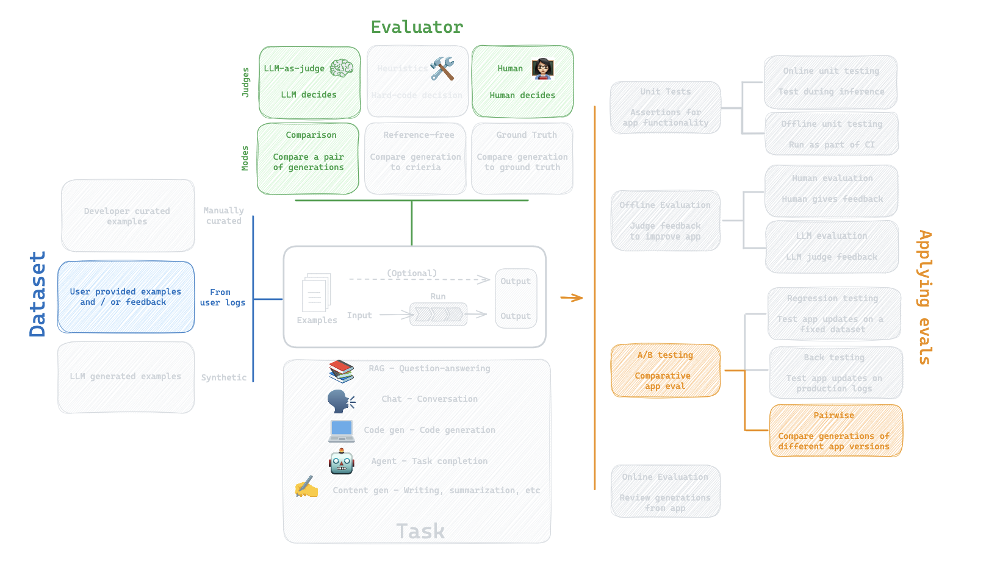

Let's look at an example: [paper summarization for Twitter](https://www.youtube.com/watch?v=Vn8A3BxfplE).
 
Let's define an eval set with a few example papers.

In [111]:
from langchain_community.document_loaders import ArxivLoader

# Arxiv IDs
# phi3, llama3 context extension, jamba, longRope, can llms reason & plan, action learning, roformer, attn is all you need, segment anything, # swin transformer
ids = ["2404.14219", "2404.19553", "2403.19887", "2402.13753", "2403.04121", "2402.15809", "2104.09864","1706.03762","2304.02643", "2111.09883"] 

# Load papers
docs = []
for paper_id in ids:
    doc = ArxivLoader(query=paper_id, load_max_docs=1).load()
    docs.extend(doc)

In [112]:
from langsmith import Client 

# Summarization
inputs = [d.page_content for d in docs]

# Create dataset
client = Client()
dataset_name = "Paper_Tweet_Generator"
dataset = client.create_dataset(
    dataset_name=dataset_name,
    description="Papers to summarize",
)
client.create_examples(
    inputs=[{"text": d} for d in inputs],
    dataset_id=dataset.id,
)

Define chains to summarize the paper to Tweets: 
 
* https://platform.openai.com/docs/models/
* https://docs.anthropic.com/claude/docs/models-overview

In [20]:
from langchain_cohere import ChatCohere
from langchain_openai import ChatOpenAI
from langchain_anthropic import ChatAnthropic
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.output_parsers import StrOutputParser

### Anthropic

# Prompt
system_tweet_instructions = (
    "<role> You are an assistant that generates Tweets to distill / summarize"
    " an academic paper. Ensure the summary: (1) has an engaging title, " 
    " (2) provides a bullet point list of main points from the paper, "
    " (3) utilizes emojis, (4) includes limitations of the approach, and " 
    " (5) highlights in one sentence the key point or innovation in the paper. </role>"
)
human = "Here is a paper to convert into a Tweet: <paper> {paper} </paper>"
prompt = ChatPromptTemplate.from_messages([("system", system_tweet_instructions), ("human", human)])

def predict_tweet_opus(example: dict):
    chat = ChatAnthropic(temperature=0, model_name="claude-3-opus-20240229")
    tweet_generator_anthropic = prompt | chat | StrOutputParser()
    response = tweet_generator_anthropic.invoke({"paper":example["text"]})
    return {"answer": response}

def predict_tweet_haiku(example: dict):
    chat = ChatAnthropic(temperature=0, model_name="claude-3-haiku-20240307")
    tweet_generator_anthropic = prompt | chat | StrOutputParser()
    response = tweet_generator_anthropic.invoke({"paper":example["text"]})
    return {"answer": response}

### OpenAI and Cohere

# Prompt
system_tweet_instructions = (
    "You are an assistant that generates Tweets to distill / summarize"
    " an academic paper. Ensure the summary: (1) has an engaging title, " 
    " (2) provides a bullet point list of main points from the paper, "
    " (3) utilizes emojis, (4) includes limitations of the approach, and " 
    " (5) highlights in one sentence the key point or innovation in the paper."
)
human = "Here is a paper to convert into a Tweet: {paper}"
prompt = ChatPromptTemplate.from_messages([("system", system_tweet_instructions), ("human", human)])

def predict_tweet_openai_4_turbo(example: dict):
    chat = ChatOpenAI(temperature=0, model_name="gpt-4-turbo")
    tweet_generator_openai = prompt | chat | StrOutputParser()
    response = tweet_generator_openai.invoke({"paper":example["text"]})
    return {"answer": response}

def predict_tweet_command_r(example: dict):
    chat = ChatCohere(model="command-r", temperature=0)
    tweet_generator_cohere = prompt | chat | StrOutputParser()
    """Use this for summary evaluation"""
    response = tweet_generator_cohere.invoke({"paper":example["text"]})
    return {"answer": response}

In [21]:
from langchain_openai import ChatOpenAI
from langsmith.schemas import Example, Run
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.pydantic_v1 import BaseModel, Field
from langsmith.evaluation import LangChainStringEvaluator, evaluate

def answer_evaluator(run: Run, example: Example) -> dict:
    """
    A simple evaluator for summary generation
    """

    # Get question, answer, and reference answer 
    input_text = example.inputs["text"] # we dont use in grading
    prediction = run.outputs["answer"]

    # Data model for grade
    class GradeSummary(BaseModel):
        """A numerical score for summary quality."""
        score: int = Field(description="Answer meets criteria, score from 0 to 5")
    
    # LLM with function call, use highest capacity model 
    llm = ChatOpenAI(model="gpt-4-turbo", temperature=0) # 
    structured_llm_grader = llm.with_structured_output(GradeSummary)
    
    # Prompt 
    system = """You are grading summary Tweets for academic papers. Ensure that the Assistant's Answer is engaging and meets the 
            following criteria: (1) has an engaging title, (2) provides a bullet point list of main points from the paper, (3) 
            utilizes emojis, (4) includes limitations of the approach, and (5) highlights in one sentence the key point in the paper. 
            A score of 5 means that the Assistant answer contains all 5 of the criteria and is engaging, the highest (best) score. 
            A score of 0 means that the Assistant answer meets 0 of the criteria, and this is the lowest possible score you can give."""
    
    grade_prompt = ChatPromptTemplate.from_messages(
        [
            ("system", system),
            ("human", "Assistant's Answer for the paper summary: {prediction}"),
        ]
    )
    
    answer_grader = grade_prompt | structured_llm_grader
    score = answer_grader.invoke({"prediction": prediction})
    return {"key": "summary_engagement_score", "score": int(score.score)}

In [14]:
dataset_name = "Paper_Tweet_Generator"

experiment_results = evaluate(
    predict_tweet_openai_4_turbo,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="summary-gpt4-turbo",
    metadata={"variant": "paper summary tweet, gpt4-turbo"},
)

experiment_results = evaluate(
    predict_tweet_opus,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="summary-opus",
    max_concurrency=2,
    metadata={"variant": "paper summary tweet, opus"},
)

experiment_results = evaluate(
    predict_tweet_command_r,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="summary-cmd-r",
    max_concurrency=2,
    metadata={"variant": "paper summary tweet, cmd-r"},
)

experiment_results = evaluate(
    predict_tweet_haiku,
    data=dataset_name,
    evaluators=[answer_evaluator],
    experiment_prefix="summary-haiku",
    max_concurrency=2,
    metadata={"variant": "paper summary tweet, haiku"},
)

View the evaluation results for experiment: 'summary-gpt4-turbo-bfeb78f0' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=9b49dbb9-dfe4-4477-b3fa-4dc380d6ffef




0it [00:00, ?it/s]

Failed to get info from https://api.smith.langchain.com: ConnectionError(ProtocolError('Connection aborted.', ConnectionResetError(54, 'Connection reset by peer')))


View the evaluation results for experiment: 'summary-opus-21590361' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=4b7bd051-8053-4a23-8a58-93eaa625a402




0it [00:00, ?it/s]

View the evaluation results for experiment: 'summary-cmd-r-f692a55c' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=6139fc3f-27f4-45a7-80da-c5419ae1305a




0it [00:00, ?it/s]

View the evaluation results for experiment: 'summary-haiku-17770059' at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=2ff1584e-c392-491e-afd6-f79102c1b066




0it [00:00, ?it/s]

Now, we can do a pairwise eval to some the outputs against each other.

In [22]:
from langchain import hub

from langchain_openai import ChatOpenAI
from langsmith.schemas import Example, Run
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.pydantic_v1 import BaseModel, Field
from langsmith.evaluation import evaluate

def evaluate_pairwise(runs: list, example) -> dict:
    """
    A simple evaluator for pairwise answers to score based on  engagement
    """

    # Store scores
    scores = {}
    for i, run in enumerate(runs):
        scores[run.id] = i
    
    # Runs is the pair of runs for each example
    answer_a = runs[0].outputs["answer"]
    answer_b = runs[1].outputs["answer"]

    # LLM with function call, use highest capacity model 
    llm = ChatOpenAI(model="gpt-4-turbo", temperature=0) 
    
    # Structured prompt  
    grade_prompt = hub.pull("rlm/pairwise-evaluation-tweet-summary")
    answer_grader = grade_prompt | llm

    # Get score
    score = answer_grader.invoke({"question": system_tweet_instructions, "answer_a": answer_a, "answer_b": answer_b})
    score = score["Preference"]

    # Map from the score to the run assisnment 
    if score == 1: # Assistant A is preferred 
        scores[runs[0].id] = 1
        scores[runs[1].id] = 0
    elif score == 2: # Assistant B is preferred 
        scores[runs[0].id] = 0
        scores[runs[1].id] = 1
    else:
        scores[runs[0].id] = 0
        scores[runs[1].id] = 0
        
    return {"key": "ranked_preference", "scores": scores}

In [16]:
from langsmith.evaluation import evaluate_comparative

evaluate_comparative(
    # Replace the following array with the names or IDs of your experiments
    ["summary-cmd-r-f692a55c", "summary-opus-21590361"],
    evaluators=[evaluate_pairwise],
)

View the pairwise evaluation results at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=6139fc3f-27f4-45a7-80da-c5419ae1305a%2C4b7bd051-8053-4a23-8a58-93eaa625a402&comparativeExperiment=64902bca-0a0f-47b6-ae54-a498ddd50899




  0%|          | 0/10 [00:00<?, ?it/s]

In [17]:
evaluate_comparative(
    # Replace the following array with the names or IDs of your experiments
    ["summary-opus-21590361","summary-haiku-17770059"],
    evaluators=[evaluate_pairwise],
)

View the pairwise evaluation results at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=4b7bd051-8053-4a23-8a58-93eaa625a402%2C2ff1584e-c392-491e-afd6-f79102c1b066&comparativeExperiment=1ff9fffd-eaf3-4966-8b21-dd4dcbc93c9b




  0%|          | 0/10 [00:00<?, ?it/s]

In [18]:
evaluate_comparative(
    # Replace the following array with the names or IDs of your experiments
    ["summary-gpt4-turbo-bfeb78f0","summary-opus-21590361"],
    evaluators=[evaluate_pairwise],
)

View the pairwise evaluation results at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=9b49dbb9-dfe4-4477-b3fa-4dc380d6ffef%2C4b7bd051-8053-4a23-8a58-93eaa625a402&comparativeExperiment=cfbc57bc-1511-4fd4-9706-2856d7dffd99




  0%|          | 0/10 [00:00<?, ?it/s]

In [19]:
evaluate_comparative(
    # Replace the following array with the names or IDs of your experiments
    ["summary-opus-21590361", "summary-cmd-r-f692a55c"],
    evaluators=[evaluate_pairwise],
)

View the pairwise evaluation results at:
https://smith.langchain.com/o/1fa8b1f4-fcb9-4072-9aa9-983e35ad61b8/datasets/aa0970b1-f667-461a-a266-4e7a4596d5d3/compare?selectedSessions=4b7bd051-8053-4a23-8a58-93eaa625a402%2C6139fc3f-27f4-45a7-80da-c5419ae1305a&comparativeExperiment=b63d9c68-f12d-40c3-92bf-4340bd411a0e




  0%|          | 0/10 [00:00<?, ?it/s]